# Mutual Information Analysis
This script analyzes the connections selected by mutual information (MI).

In [1]:
import pandas as pd
import numpy as np

%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set_theme(
    context="paper", 
    style="whitegrid", 
    font_scale=1.2,
    rc={'figure.figsize': (20, 20), 'figure.dpi': 300}
)

## Get Data

In [2]:
from common.data import get_data

X, Y, demographics = get_data()
ages, sexes = demographics['Age'], demographics['Sex']

print(f'X: {X.shape} | Y: {len(Y.keys())} | Age: {ages.shape} | Sex: {sexes.shape}')

X: (594, 34716) | Y: 16 | Age: (594,) | Sex: (594,)


In [3]:
selected_target = "WISC_PSI"
y = Y[selected_target]

print(f'y: {y.shape}')

y: (594,)


### Age Binning

In [4]:
from common.binning import bin_by_age

bins = bin_by_age(X, y, ages, y)
bin_1, bin_2, bin_3 = bins[0], bins[1], bins[2]
print(f'Bin 1: {bin_1[0].shape} | Bin 2: {bin_2[0].shape} | Bin 3: {bin_3[0].shape}')

Bin 1: 214 | Bin 2: 258 | Bin 3: 206


## Plot Connections

In [6]:
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from common.plotting import plot_connections

**MI Connections (All Ages)**

In [7]:
mi = SelectKBest(mutual_info_regression, k=1000)
X_mi = mi.fit_transform(X, y)
print("X_mi shape:", X_mi.shape)

X_mi shape: (678, 1000)


0 1


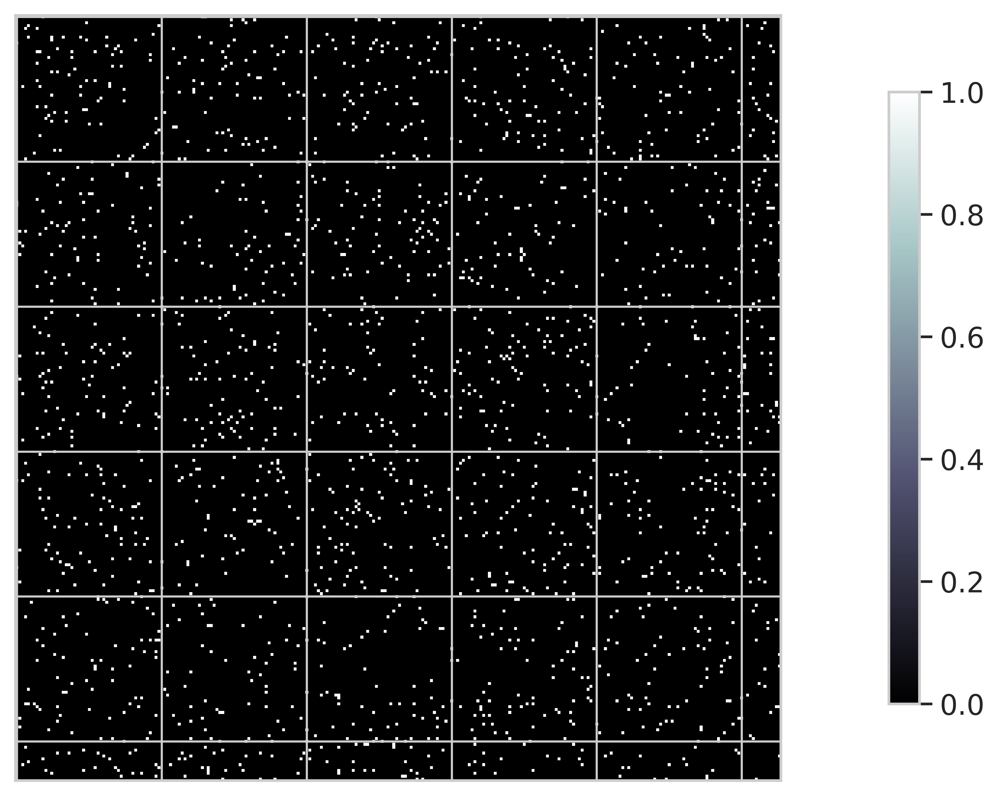

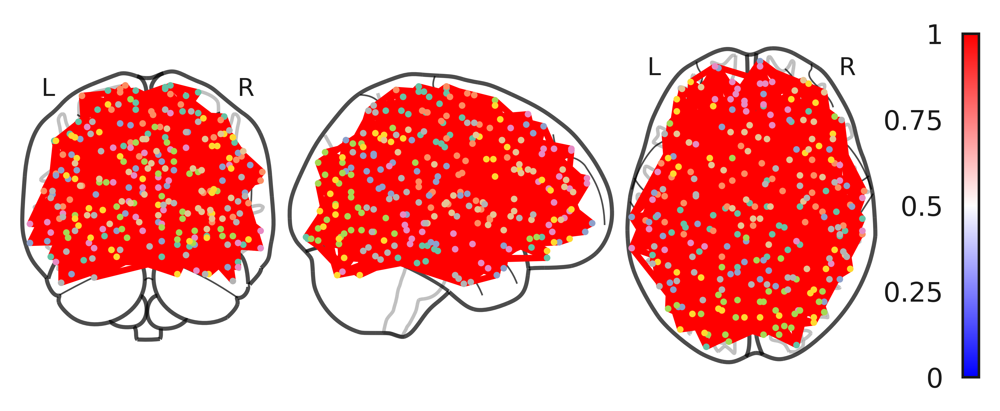

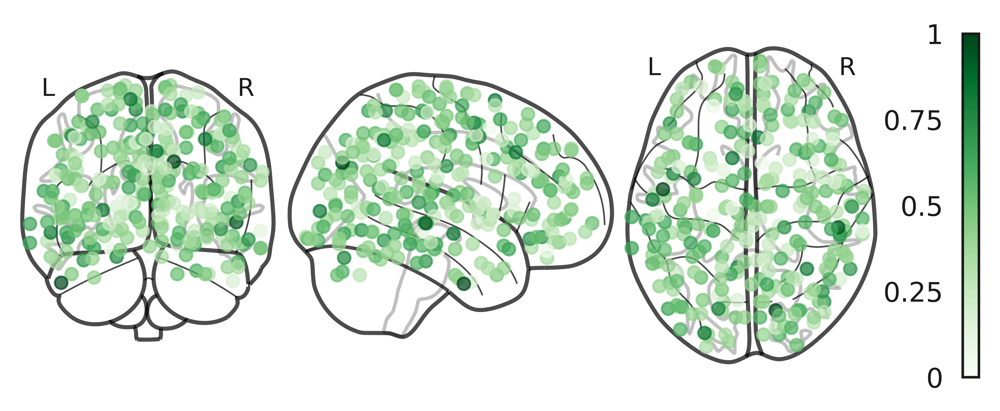

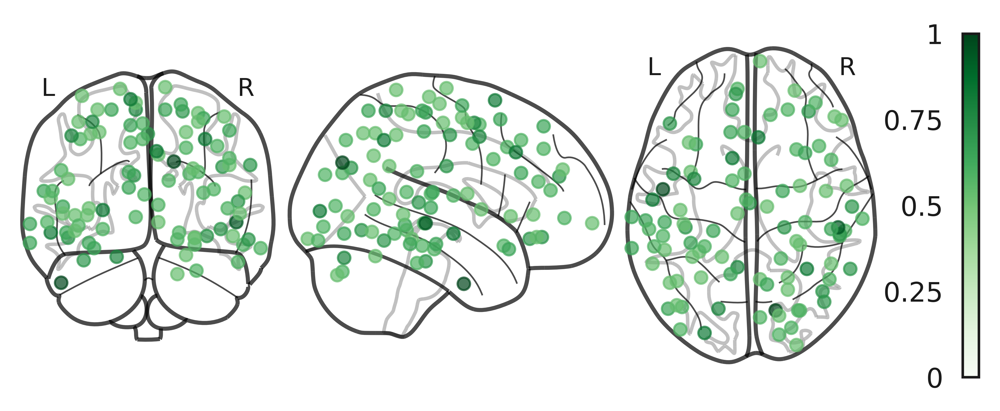

In [8]:
selected_features = mi.get_support().astype('int')
print(np.min(selected_features), np.max(selected_features))
plot_connections(selected_features, 0, 1, mi_mode=True)

**MI Connections (Age Bins)**

In [9]:
mi_bin_1 = SelectKBest(mutual_info_regression, k=2500)
X_bin_1 = mi_bin_1.fit_transform(bin_1.X, bin_1.y)

mi_bin_2 = SelectKBest(mutual_info_regression, k=2000)
X_bin_2 = mi_bin_2.fit_transform(bin_2.X, bin_2.y)

mi_bin_3 = SelectKBest(mutual_info_regression, k=500)
X_bin_3 = mi_bin_3.fit_transform(bin_3.X, bin_3.y)

print("X_bin_1 shape:", X_bin_1.shape, "X_bin_2 shape:", X_bin_2.shape,
      "X_bin_3 shape:", X_bin_3.shape)

X_bin_1 shape: (214, 2500) X_bin_2 shape: (258, 2000) X_bin_3 shape: (206, 500)


In [13]:
selected_features_bin_1 = mi_bin_1.get_support().astype('int')
selected_features_bin_2 = mi_bin_2.get_support().astype('int')
selected_features_bin_3 = mi_bin_3.get_support().astype('int')
# plot_connections(selected_features_bin)

**Overlapping Connections Between All and Bin Ages**

In [14]:
from common.calculation import multiply, compare_age_similarity
from common.plotting import plot_connections

[138, 156, 25, 144, 36, 32]


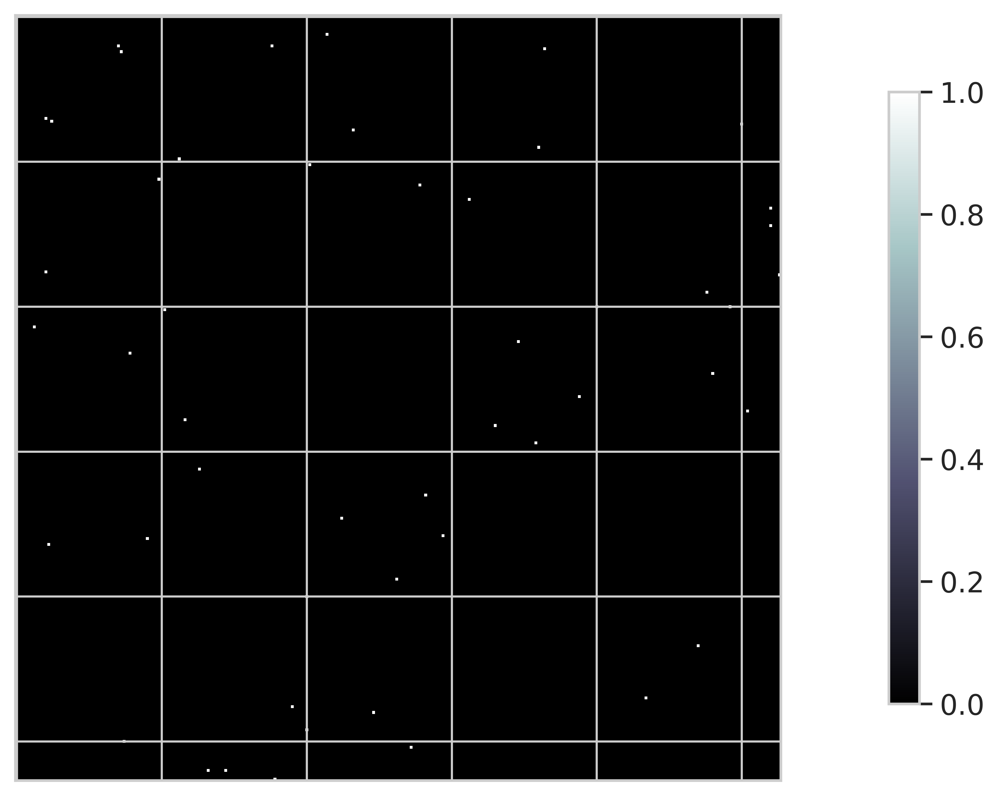

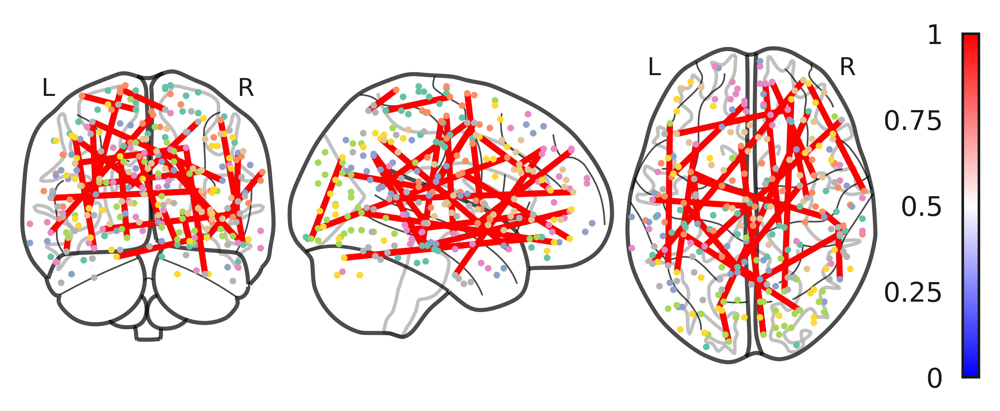

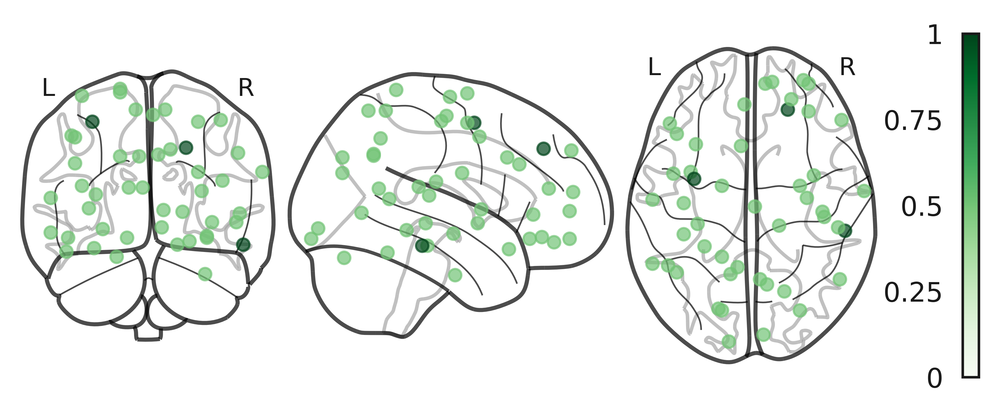

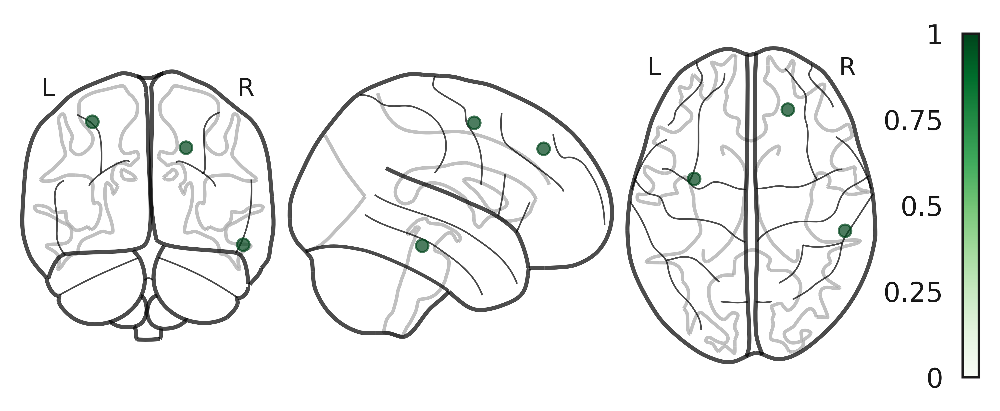

In [17]:
overlaps = compare_age_similarity(selected_features, selected_features_bin_1, 
                                 selected_features_bin_2, selected_features_bin_3, multiply)
print([len(overlap[overlap == 1]) for overlap in overlaps])

plot_connections(overlaps[2], vmin=0, vmax=1, mi_mode=True)

**Overlapping Connections Between Overlaps**

In [14]:
for start in range(0, len(overlaps)):
    overlap_overlaps = []
    for other_overlap in overlaps[start:]:
        overlap_overlap = multiply(overlaps[start], other_overlap)
        overlap_overlaps.append(overlap_overlap)
    print([len(overlap[overlap == 1]) for overlap in overlap_overlaps])

[197, 23, 4, 23, 4, 0]
[202, 7, 23, 0, 7]
[59, 0, 4, 7]
[145, 3, 3]
[30, 3]
[35]


**Calculate the locations in the Powers atlas with the greatest node strengths**

In [ ]:
num_nodes = 3
node_strength = np.sum(np.abs(fc), axis=0)
node_strength /= np.max(node_strength)
highest_nodes = np.argpartition(
    node_strength, -num_nodes)[-num_nodes:]

print(coords[highest_nodes])

## Hyperparameter Search

In [4]:
from scipy import stats
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import RepeatedKFold, cross_validate
from sklearn.feature_selection import SelectKBest, mutual_info_regression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, explained_variance_score
from sklearn.pipeline import make_pipeline

In [5]:
def regression_scorer(reg, X, y):
    y_pred = reg.predict(X)[:, 0]
    
    return {'r2': r2_score(y, y_pred), 'pearsonr': stats.pearsonr(y, y_pred)[0],
            'explained_variance': explained_variance_score(y, y_pred)}

scoring = ['test_r2', 'test_pearsonr', 'test_explained_variance']
rkf = RepeatedKFold(n_splits=10, n_repeats=10, random_state=251183)

In [6]:
%%time
k_range = range(500, 5000, 500)
all_scores = []

for k in k_range:
    estimators = [StandardScaler(), SelectKBest(mutual_info_regression, k=k), 
                  PLSRegression(n_components=2)]
    pipe = make_pipeline(*estimators)
    
    scores = cross_validate(pipe, X, y, cv=rkf, scoring=regression_scorer, n_jobs=-1, 
                            return_train_score=True, return_estimator=True)
    all_scores.append(scores)

print(f'Target: {selected_target}')

k_metric = {metric: [] for metric in scoring}
for metric in scoring:
    for k in all_scores:
        k_metric[metric].append(np.mean(k[metric]))
        
test_r2 = k_metric['test_r2']
test_pearsonr = k_metric['test_pearsonr']
optimal_k = np.argmax(test_r2)

print(f'k: {k_range[optimal_k]}, test_r2: {test_r2[optimal_k]:.2f}, r: {test_pearsonr[optimal_k]:.2f}')

Target: WISC_PSI
k: 4500, test_r2: -0.13, r: 0.10
CPU times: user 11.3 s, sys: 2.22 s, total: 13.5 s
Wall time: 1h 42min 40s


In [12]:
x_axis = k_range

plt.title(selected_measure)
plt.plot(x_axis, train_scores, label="Train")
plt.plot(x_axis, test_scores, label="Test")
plt.legend()

def annot_max(x, y):
    xmax = x[np.argmax(y)]
    ymax = np.amax(y)
    print(xmax, ymax)
    
    text = "x={:.3f}, y={:.3f}".format(xmax, ymax)
    ax = plt.gca()
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    arrowprops = dict(arrowstyle="->",connectionstyle="angle,angleA=0,angleB=60")
    kw = dict(xycoords='data',textcoords="axes fraction",
              arrowprops=arrowprops, bbox=bbox_props, ha="right", va="top")
    ax.annotate(text, xy=(xmax, ymax), xytext=(0.94,0.96), **kw)

annot_max(x_axis, test_scores)
plt.show()

1750 0.1308586110723437
